In [2]:
import tensorflow as tf
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
#config.gpu_options.per_process_gpu_memory_fraction = 0.3
#set_session(tf.Session(config=config))
session = tf.Session(config=config)

/home/student1/anaconda3/envs/keras/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
tf.__version__

'1.4.1'

# Tensorflow图像处理以及数据读取

本人研究的方向是图像处理，这个领域几乎被深度学习的方法给统治了，例如图像去燥、图像超分辨、图像增强等等。在模拟实现相关论文的方法时，我发现最难的部分并不是深度学习的网络，而是如何构建你的训练集。通常，为了构建一个可训练的数据库我需要做：

1. 上网找到论文提到的图像数据库，或者自己收集图像
2. 对图像进行处理，构建训练所需的数据库，处理的方式各种各样，包括
    + 图像颜色域的变化，例如RGB转HSV，RGB转Gray等等
    + 图像大小的缩放，例如将不同大小的图像缩放为大小一致的图像
    + 提前图像块(image patch)，就是从整张图像中，扣下小块(例如32*32)的小图像,这么做主要是因为可以增加训练数据的量，另外小块的图像训练起来速度更快，image patch的合理性是基于卷积神经网络的感受野(Receptive field)通常不会太大
    + 数据增强(Data augmentation)，例如将图像上下翻转，左右翻转，裁剪，旋转等等。这里有一篇[Keras-5 基于 ImageDataGenerator 的 Data Augmentation实现](https://blog.csdn.net/weiwei9363/article/details/78635674)可以让大家大致明白什么是Data augmentation
    
3. 为了训练，给深度网络喂数据，我还需要写batch generator，就是用来生成一个batch的东西

一般，我们对整个训练过程有两种方案
1. 构建数据库的部分是独立，也就是说我们对找到的图像做预处理，将预处理的结果保存起来，这就算构建好训练的数据库了，然后训练时从这数据库里直接拿数据进行训练
2. 训练时实时地预处理一个batch的图像，将处理的结果作为训练的输入

第一种方法将训练集的构建和网络的训练分开，并且将预处理结果存在电脑中，这样做训练的代码会比较简单，且直接读入处理好的数据能让训练速度更快，当然，不足的地方就是不够灵活，如果预处理的方式改变了(例如，原本是RGB转HSV，现在我要RGB转Gray)，那么需要重新构建一个数据库，造成硬盘空间的浪费

第二种方法虽然训练速度不如第一种，但是足够灵活，我们主要关注第二种方法。

在TensorFlow中，图像处理主要由`tf.image`模块支持，batch generator主要用`tf.data.Dataset`实现，下面我们来看看整个流程的具体实现

## 1 获取所有图片的路径

很明显，如果训练集很大，图片很多，我们无法一次读取所有图片进行训练，因此我们先找到所有图片的路径，在需要读取图片时再根据路径读取图片

In [4]:
import glob
# images_dir 下存放着需要预处理的图像
images_dir = '/home/public/butterfly/dataset_detection/JPEGImages/'

# 查找图片文件, 根据具体数据集自由添加各种图片格式(jpg, jpeg, png, bmp等等)
images_paths = glob.glob(images_dir+'*.jpg')
images_paths += glob.glob(images_dir+'*.jpeg')
images_paths += glob.glob(images_dir+'*.png')
print('Find {} images, the first 10 image paths are:'.format(len(images_paths)))
for path in images_paths[:10]:
    print(path)

Find 717 images, the first 10 image paths are:
/home/public/butterfly/dataset_detection/JPEGImages/IMG_001000.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_000969.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_000805.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_000158.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_001017.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_001155.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_001404.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_000202.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_000568.jpg
/home/public/butterfly/dataset_detection/JPEGImages/IMG_000022.jpg


In [5]:
import numpy as np
# split training set and test data
test_split_factor = 0.2
n_test_path = int(len(images_paths)*test_split_factor)
# 转出numpy数据，方便使用
train_image_paths = np.asarray(images_paths[:-n_test_path])
test_image_paths = np.asarray(images_paths[-n_test_path:])
print('Number of train set is {}'.format(train_image_paths.shape[0]))
print('Number of test set is {}'.format(test_image_paths.shape[0]))

Number of train set is 574
Number of test set is 143


## 2. Batch Generator

我们将使用`tf.data.Dataset`来实现batch generator，这里借鉴了一篇博客 [TensorFlow全新的数据读取方式：Dataset API入门教程](https://blog.csdn.net/kwame211/article/details/78579035)。我们直接上代码，具体解释请看注释

In [6]:
def gaussian_noise_layer(input_image, std):
    noise = tf.random_normal(shape=tf.shape(input_image), mean=0.0, stddev=std, dtype=tf.float32)
    noise_image = tf.cast(input_image, tf.float32) + noise
    noise_image = tf.clip_by_value(noise_image, 0, 1.0)
    return noise_image

def parse_data(filename):
    '''
    导入数据，进行预处理，输出两张图像,
    分别是输入图像和目标图像（例如，在图像去噪中，输入的是一张带噪声图像，目标图像是无噪声图像）
    Args:
        filaneme, 图片的路径
    Returns:
        输入图像，目标图像
    '''
    # 读取图像
    image = tf.read_file(filename)
    # 解码图片
    image = tf.image.decode_image(image)
        
    # 数据预处理，或者数据增强，这一步根据需要自由发挥
    
    # 随机提取patch
    image = tf.random_crop(image, size=(100,100, 3))
    # 数据增强，随机水平翻转图像
    image = tf.image.random_flip_left_right(image)
    # 图像归一化
    image = tf.cast(image, tf.float32) / 255.0
    # 加噪声
    n_image =gaussian_noise_layer(image, 0.5)
    
    return n_image, image

In [7]:
def train_generator(batchsize, shuffle=True):
    '''
    生成器，用于生产训练数据
    Args:
        batchsize,训练的batch size
        shuffle, 是否随机打乱batch
        
    Returns:
        训练需要的数据
    '''
    
    with tf.Session() as sess:
        # 创建数据库
        train_dataset = tf.data.Dataset().from_tensor_slices((train_image_paths))
        # 预处理数据
        train_dataset = train_dataset.map(parse_data)
        # 设置 batch size
        train_dataset = train_dataset.batch(batchsize)
        # 无限重复数据
        train_dataset = train_dataset.repeat()
        # 洗牌，打乱
        if shuffle:
            train_dataset = train_dataset.shuffle(buffer_size=4)
        
        # 创建迭代器
        train_iterator = train_dataset.make_initializable_iterator()
        sess.run(train_iterator.initializer)
        train_batch = train_iterator.get_next()
        
        # 开始生成数据
        while True:
            try:
                x_batch, y_batch = sess.run(train_batch)
                yield (x_batch, y_batch)
            except:
                # 如果没有  train_dataset = train_dataset.repeat()
                # 数据遍历完就到end了，就会抛出异常
                train_iterator = train_dataset.make_initializable_iterator()
                sess.run(train_iterator.initializer)
                train_batch = train_iterator.get_next()
                x_batch, y_batch = sess.run(train_batch)
                yield (x_batch, y_batch)

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

# 显示图像
def view_samples(samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, sharey=True, sharex=True)
    
    for ax, img in zip(axes.flatten(), samples):
        ax.axis('off')
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
        
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
    return fig, axes

/home/student1/anaconda3/envs/keras/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


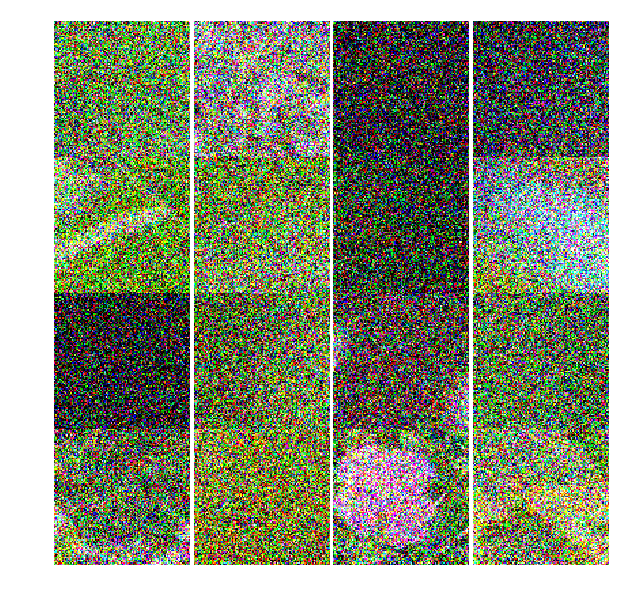

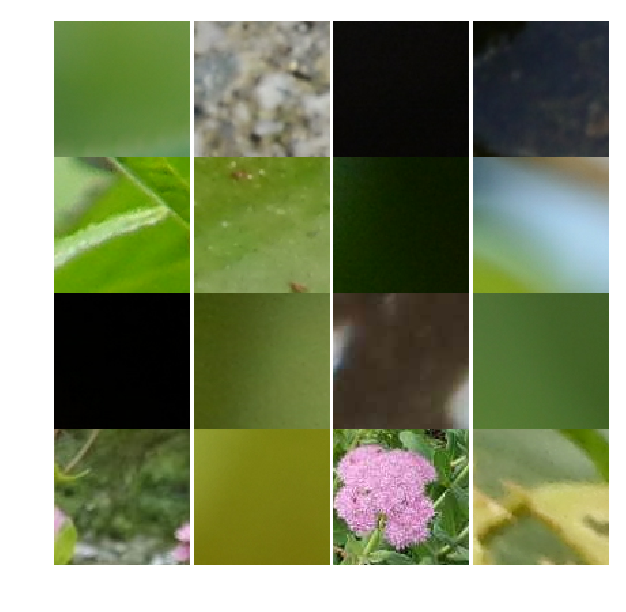

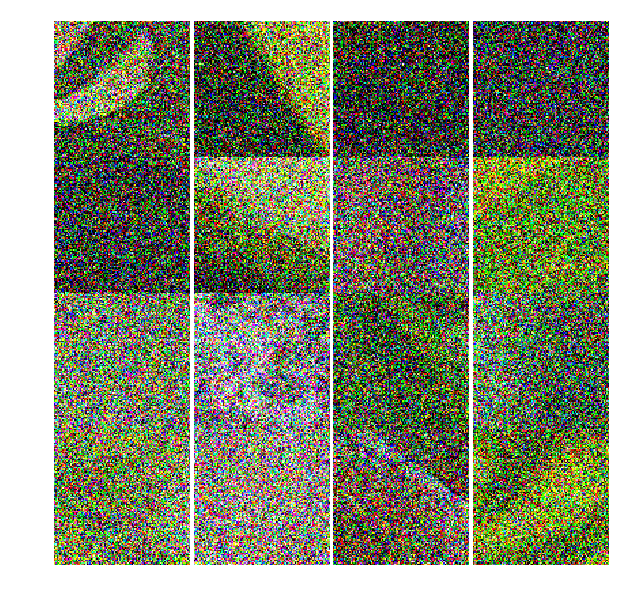

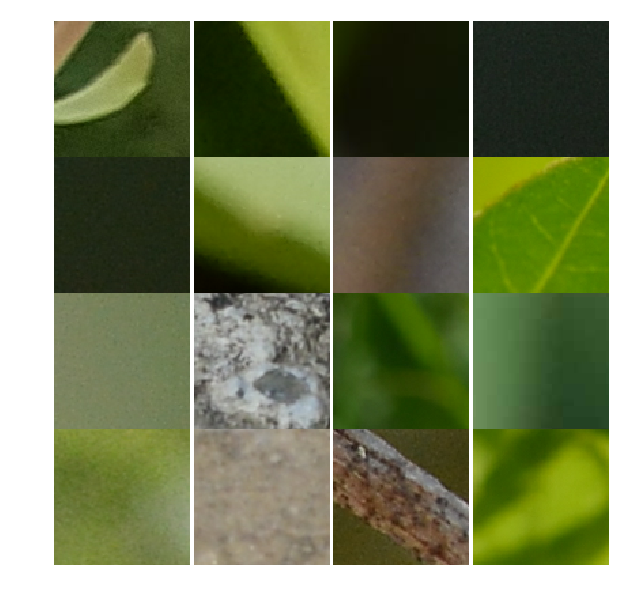

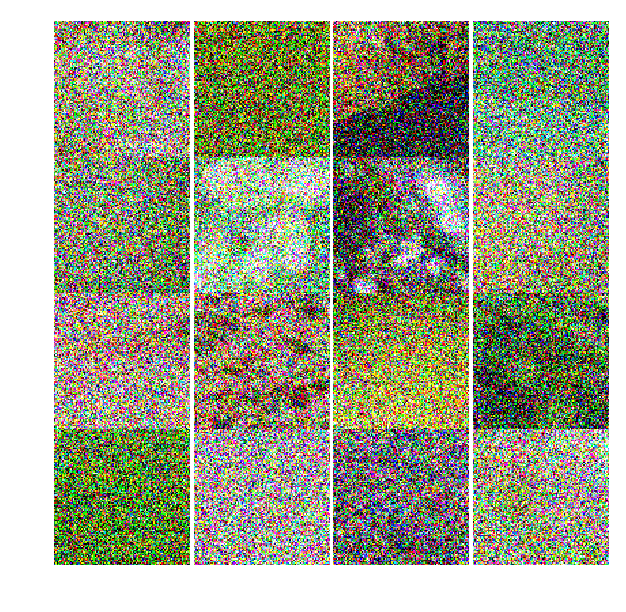

...

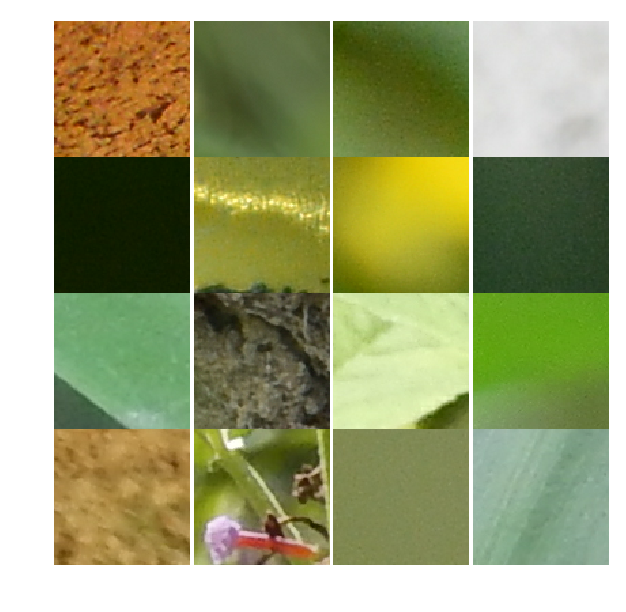

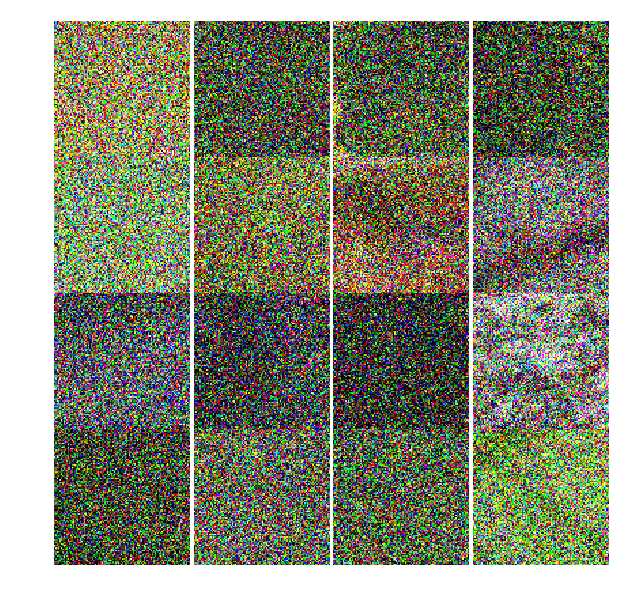

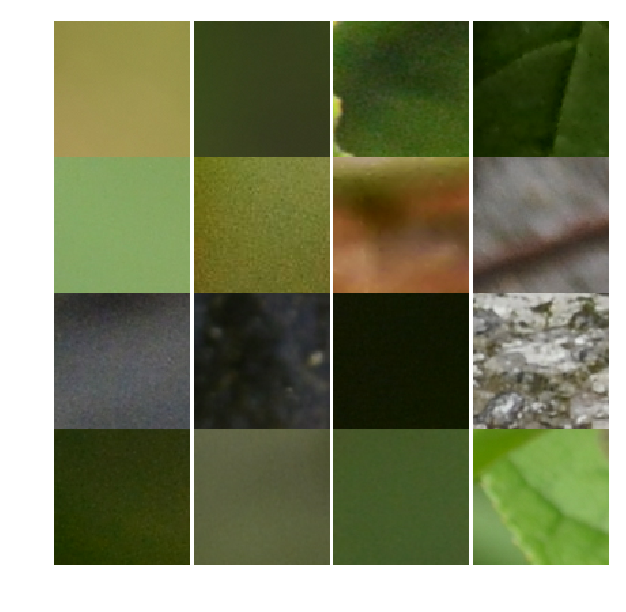

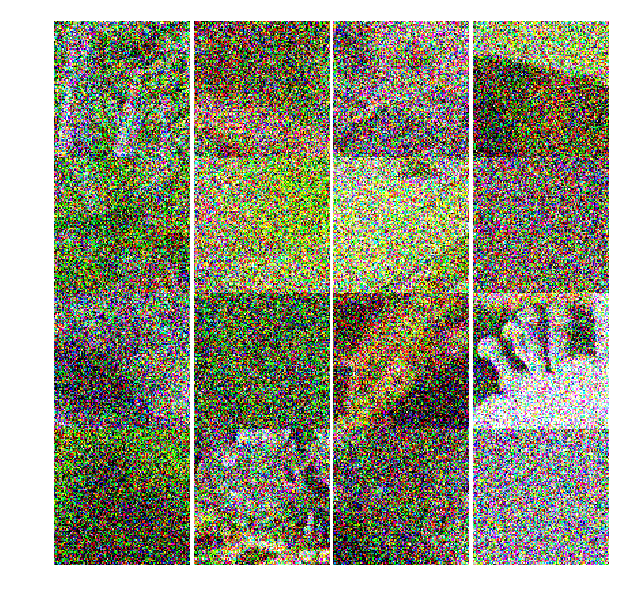

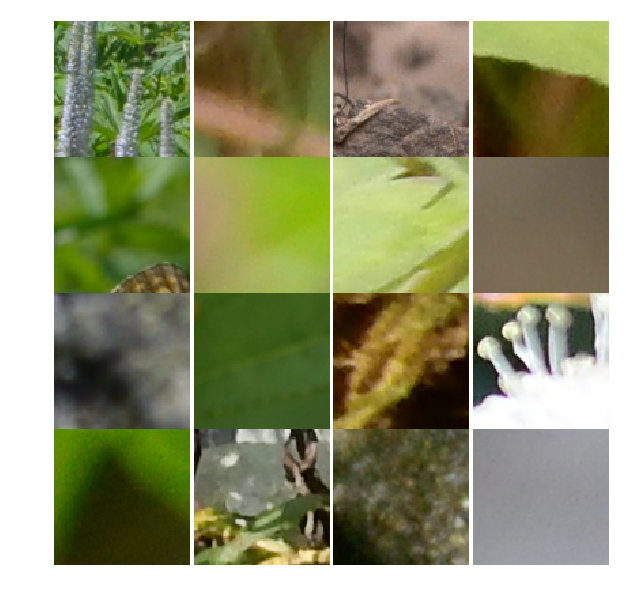

In [9]:
# 测试一下我们的代码
train_gen = train_generator(16)

iteration = 10
for i in range(iteration): 
    noise_x, x = next(train_gen)
    _ = view_samples(noise_x, 4,4)
    _ = view_samples(x, 4, 4)

## 总结

TensorFlow提供了一整套图像预处理以及数据生成的机制，我们实现了一个简单的常用的数据处理框架，总结为三步
1. 获取所有图片的路径
2. 写好预处理的代码(parse_data)
3. 定义好数据生成器
基于以上的流程，稍微加以修改就能够应对大部分训练要求